In [1]:
import argparse
import os, sys
sys.path.append('/home/warrenzhao/PointNet-AE-3DMM')

import time
import copy
import math
import pickle
import statistics

import numpy as np
import pandas as pd
import open3d as o3d
import torchvision
import pytorch3d
from tqdm import tqdm
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Import pytorch dependencies
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader
from torch.nn.modules.utils import _single, _pair, _triple
from torchsummary import summary

from pytorch3d.loss import chamfer_distance

# Import toolkits
from utils.visualization_3D_objects import *
from utils.preprocessing import *
from utils.read_object import *
from utils.model_averaging import *
from utils.model_PCA import *
from utils.morphable_model import *

from model.model import *

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
DATA_PATH = "/home/warrenzhao/PointNet-AE-3DMM/data/processedShapeNet/car/"
TRAIN_BATCH_SIZE = 12
VAL_BATCH_SIZE = 10
LATENT_DIM = 128
INITIAL_LR = 1e-3
MOMENTUM = 0.9
EPOCHS = 350
DECAY_EPOCHS = np.arange(30, 360, 30)
DECAY = 0.7
CHECKPOINT_FOLDER = "/home/warrenzhao/PointNet-AE-3DMM/saved_model/"
MODEL_TYPE = "PointNetAE_lowerDim"

### Import Preprocessed ModelNet40 cars (Run shapenet_preprocessing.ipynb first to get these data)

In [3]:
#load all aligned cars
f1 = open(DATA_PATH+'train.txt','rb')
X_train = pickle.load(f1)
f2 = open(DATA_PATH+'test.txt','rb')
X_test = pickle.load(f2)

In [4]:
# construct dataloader
train_loader = DataLoader(
    X_train, 
    batch_size=TRAIN_BATCH_SIZE, 
    shuffle=True, 
    num_workers=4,
    drop_last=True
)
val_loader = DataLoader(
    X_test, 
    batch_size=VAL_BATCH_SIZE, 
    shuffle=False, 
    num_workers=4,
    drop_last=True
)
full_loader = DataLoader(
    np.vstack([X_train, X_test]), 
    batch_size=VAL_BATCH_SIZE, 
    shuffle=False, 
    num_workers=4,
    drop_last=True
)

### Load saved model

In [5]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
if device =='cuda':
    print("Run on GPU...")
else:
    print("Run on CPU...")

model_test = PointNet_AE_lowerDim(3, X_train[0].shape[1], LATENT_DIM)
state_dict = torch.load(os.path.join(CHECKPOINT_FOLDER, MODEL_TYPE + '.pth')) # change the path to your own checkpoint file
model_test.cuda()
model_test.load_state_dict(state_dict['state_dict'])
model_test.eval()

print("Best Epoch: ", state_dict['epoch'])

Run on GPU...
Best Epoch:  341


In [6]:
x = val_loader.__iter__().next() # hack to grab a batch

inputs = x.float().to(device)

outputs, global_feat = model_test(inputs)

X = inputs.cpu().detach().numpy()[6]
X_hat = outputs.cpu().detach().numpy()[6]

draw3DPoints(X, "Original Car")
draw3DPoints(X_hat, "Reconstructed Car")

In [7]:
def extractGlobalFeatForAllData(full_loader, model_test, device):
    global_feat_lst = []
    for batch_idx, (inputs) in enumerate(full_loader):
        # copy inputs to device
        inputs = inputs.float().to(device)
        # compute the output and loss
        outputs, global_feat_i = model_test(inputs)
        global_feat_lst.append(global_feat_i.cpu().detach().numpy())
        
    global_feat = np.vstack(global_feat_lst)
    return global_feat

global_feat = extractGlobalFeatForAllData(full_loader, model_test, device)
print(global_feat.shape)

(1820, 128)


[ 12  28 115  51  46 100  48  22  42  84 103  10  76   8  82  29  19  69
  90  81  61  98  89  93  79  37  45  41  24  36  70   0  20  64   1  47
   6  49  92  88  95  23 123  65   3 102  67 106 117  30 101 116  68  55
  40  14 118 125  27 119 122  91  77  34   7  71  87  97  25  32 112  58
 107  73  59  80  17 111  35  21  16  31 121  43 108 109  83 110 120  13
  86  94  78  39  33  63  18  62  75 113   9  54  60  11  66 124  85  50
 126 127 114  72   4  96  15  57  56 104  44  53  99   5 105  26  52  74
   2  38]


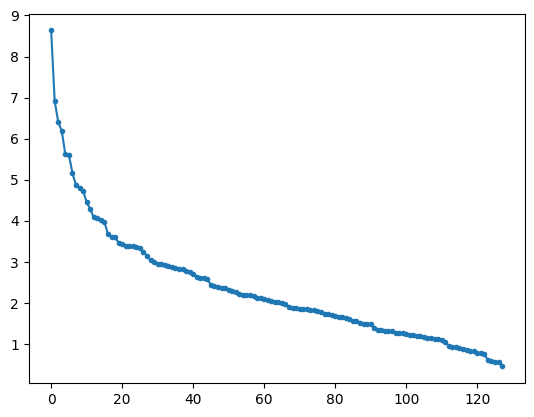

In [13]:
def computeAllDataTopK(global_feat, model_test, top_k = 25, mod_range = 10, n_step = 20):

    mu, var = np.mean(global_feat, axis = 0), np.var(global_feat, axis = 0)
    sigificant_feature_idx = np.argsort(var)[::-1]

    print(sigificant_feature_idx)
    plt.clf
    plt.plot(var[sigificant_feature_idx], '.-')
    plt.axis('tight')

    X_list = dict()
    for idx in sigificant_feature_idx[:top_k]:
        X_feat_list = []
        lower_bound = mu[idx] - var[idx] * mod_range
        higher_bound = mu[idx] + var[idx] * mod_range
        for step in np.linspace(lower_bound, higher_bound, n_step):
            new_features = torch.from_numpy(global_feat).cuda()
            new_features[:, idx] = step
            X = model_test.decoder(model_test.fc_decode(new_features)).cpu().detach().numpy()
            X_feat_list.append(X)

        X_feat_list = np.asarray(X_feat_list)
        X_list[idx] = X_feat_list

    return X_list, sigificant_feature_idx

X_list, sigificant_feature_idx = computeAllDataTopK(global_feat, model_test)

In [9]:
def examineObj(obj_idx):
    for idx in X_list.keys():
        draw3DpointsSlider(X_list[idx], idx, obj_idx)
        end = int(input("Are you finished? 0: No, 1: Yes"))
        if (end == 1):
            break
        
        clear_output(wait=True)

examineObj(0)

In [16]:
feat_idx = 3
draw3DpointsSlider(X_list[sigificant_feature_idx[feat_idx]], sigificant_feature_idx[feat_idx], 0)